# <center>Part 1: Importance Sampling and risk theory </center>

We will use the importance sampling technique as variance reduction method for a classical problem of risk theory.


## Risk evaluation  

Let us consider an insurance company starting with some initial capital $b$. The business earns money due to the premiums, but has to face claims. Premiums arrive at constant rate, while claims arrive at random times with random magnitudo. If at any time $t>0$ the surplus level becomes negative, the company fails. Is it possible to evaluate the probability $P(b)$ that company goes bankrupt? 
Modern risk theory goes back to the works of Filip Lundberg and Harald Cramér. They developed quantitative approaches to evaluate the ruin probability. Here we consider a variant of the original model where the surplus level is a random walk evolving at discrete time $\tau=0,1,2,\ldots$. 

We call $x(\tau)$ the surplus level at time $\tau$. We know that $x(0)=b$ and suppose the following evolution:

$$ x(\tau)=x(\tau-1) +\xi_\tau$$

Here $\xi_1,\xi_2, \ldots, \xi_\tau$ are iid Gaussian random numbers with

$$ \langle \xi_i\rangle =c,\quad \quad \langle \left(\xi_i-c \right)^2\rangle=1 \quad \text{for} \; i=1,2,\ldots$$

The company has a potential success only if $c>0$, but this is not sufficient to prevent bankrupt.

How can we evaluate numerically the ruin probability $P(b)$ given $c$? 

 We have to face two problems:

(i) It is difficult to estimate the maximal time after which the fate of the insurance company should be considered as safe 
 
(ii) More importantly, for each example (i.e. each random walk) the observable is one if the path overcomes the origin and zero if it stays above. Then, for large values of b, the ruin probability is a very small number determined by the tiny fraction of 1 (the "rari nantes") appears in a "large sea" of zeros. In these conditions, direct sampling does not provide an accurate estimation of $P(b)$.
Employ the exponential tilting introduced in the lecture for a single Gaussian varialble. Here each example is random walk and it is fully defined by the sequance of jumps. The probability of a random walk of $N$ steps is then 
$$ p(\{\xi_1,\xi_2,\ldots,\xi_N\}) = \prod_{i=1}^N \left(\frac{1}{\sqrt{2 \pi}} e^{-(\xi_i-c)^2/2}\right)$$

------------------------------

(Q1) Introduce an exponential tiliting $\exp(t \xi_i)$ for all $i=1,\dots,N$. Compute the bias distribution $q(\{\xi_1,\xi_2,\ldots,\xi_N\})$:

Answer space

$$ q(\{\xi_1,\xi_2,\ldots,\xi_N\})= \prod_{i=1}^N \left(\frac{1}{\sqrt{2 \pi}} e^{-((\xi_i-c) - t)^2/2}\right) $$

--------------------------




(Q2) the weight $w(\{\xi_1,\xi_2,\ldots,\xi_N\})=p(\{\xi_1,\xi_2,\ldots,\xi_N\})/q(\{\xi_1,\xi_2,\ldots,\xi_N\})$ which tell us how to re-weight the observable in order to compensate the bias.   Explain that the $t=-2 c$ simplifies the likelihood ratio $w$

Answer space

$$w(\vec \xi)=  \prod_{i=1}^N \left( e^{-t(\xi_i-c) + t^2/2}\right) $$

The choice $t$ to $-2c$

$$w(\vec \xi)=  \prod_{i=1}^N \left( e^{2\xi_i c}\right) $$


---------------------

(Q3) The probability that the random walk $x(t)$ becomes negative at any time.
Write a code to compute the ruin probability $P(b)$ keeping the maximal time infinite. Let's set $ c=0.1, \; N_{trials}=10000\; b=20, \quad t=- 2 c $. Infer $P(b)$ with its statistical error.



Answer space

A Python code is required to answer this question.

--------------------------------------

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import math
import random
from math import pi
from scipy.special import gamma as Γ
from scipy.special import eval_genlaguerre as L

from matplotlib import animation
from matplotlib import rc
from IPython.display import HTML

#copied Fourier transform
def FT(psi_x,x_grid,k_grid):
  N=len(psi_x)
  delta_x=x_grid[1]-x_grid[0]
  delta_k=k_grid[1]-k_grid[0]
  psi_k=np.zeros(N,dtype=complex)
  for i in range(N):
    for j in range(N):
      psi_k[i]+=delta_x/math.sqrt(2*pi)*psi_x[j]*np.exp(-1j*k_grid[i]*x_grid[j])
  return psi_k

def IFT(psi_k,x_grid,k_grid):
  N=len(psi_k)
  delta_x=x_grid[1]-x_grid[0]
  delta_k=k_grid[1]-k_grid[0]
  psi_x=np.zeros(N,dtype=complex)
  for i in range(N):
    for j in range(N):
      psi_x[i]+=delta_k/math.sqrt(2*pi)*psi_k[j]*np.exp(1j*x_grid[i]*k_grid[j])
  return psi_x

#time evolution
def time_prop(psi,pot,delta_t,x_grid,k_grid):
  N1=len(x_grid)
  N2=len(k_grid)
  for i in range(0,N1):
    psi[i]=np.exp(-1j*delta_t*pot[i]/2)*psi[i]
  psi_k=FT(psi,x_grid,k_grid)
  for i in range(0,N2):
    psi_k[i]=np.exp(-1j*delta_t*k_grid[i]**2/2)*psi_k[i]
  psi=IFT(psi_k,x_grid,k_grid)
  for i in range(0,N1):
    psi[i]=np.exp(-1j*delta_t*pot[i]/2)*psi[i]
  return psi

#Morse potential
def morse_pot(D, x):
    
    return D*(np.exp(-2*(x-1))-2*np.exp(-(x-1)))


#n-th eigenfunction
def ψn (n, D, x):
    
    ν=np.sqrt(8*D)
    s=(ν-2*n-1)/(2)
    z=ν*np.exp(-(x-1))
    
    return np.sqrt((2*s*Γ(n+1))/(Γ(ν-n)))*L(n, 2*s, z)*(z**s)*np.exp(-z/2)

In [19]:
#ruin probability random walk

#parameters
c=0.1
N_trials= 10000
b=20
t=-2*c

#ruin probabilities
Ps = np.zeros(N_trials)

#iterate over trials
for run in range(N_trials):
    
    #initial capital and weight
    weight = 1
    capital = b
    
    #keep going until company goes bankrupt = infinite time
    while True:
        
        #draw change in capital, calculate new weight and new capital
        ξ = random.gauss(c+t,1)
        weight *= np.exp((c-ξ)*t + t**2/2)
        capital += ξ
        
        #bankrupt?
        if capital < 0:
            Ps[run] = weight
            break
        
#get mean and error        
P = np.mean(Ps)
err = np.std(Ps/(N_trials)**0.5)

print("ruin probability: " + str(np.round(P, decimals=6)) + "\t" + chr(177) + "\t" + str(np.round(err,decimals=6)))

ruin probability: 0.016329	±	1.6e-05


The ruin probability is given by $P(b=20) = 0.016329 \pm 0.000016$

(Q4) Plot the estimation of P(b) with its error for 
$$t=-0.16,\; t=-0.18,\ldots, t=-0.24$$

Answer space

A plot is required with few lines of conclusion.

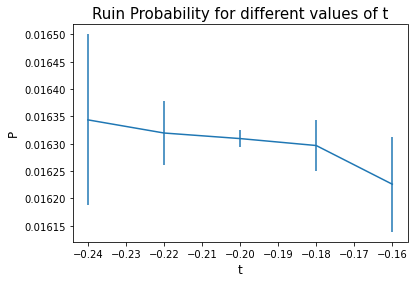

In [17]:
#parameters
ts = [-0.16-0.02*i for i in range(5)]

#returns ruin probability
def ruin_probability(c,t,b,N_trials):
    
    #iterate over trials
    for run in range(N_trials):

        #initial capital and weight
        weight = 1
        capital = b

        #keep going until company goes bankrupt = infinite time
        while True:

            #draw change in capital, calculate new weight and new capital
            ξ = random.gauss(c+t,1)
            weight *= np.exp((c-ξ)*t + t**2/2)
            capital += ξ

            #bankrupt?
            if capital < 0:
                Ps[run] = weight
                break
        
    #get mean and error        
    P = np.mean(Ps)
    err = np.std(Ps/(N_trials)**0.5)
    
    return P, err

xms = [ruin_probability(c,t,b,N_trials) for t in ts]

#plot with errorbars
plt.errorbar(ts, [xm for (xm,xerr) in xms], yerr= [xerr for (xm,xerr) in xms])
plt.title("Ruin Probability for different values of t", fontsize="15")
plt.ylabel("P", fontsize="12")
plt.xlabel("t", fontsize="12")
plt.show()

The different ruin probabilities agree within their errors. The error is significantly smaller for $t=-0.2=-2c$ than for other choices of $t$, on the one hand in this case the expression for the weight simplifies and the numerical precision increases (see Q2, though this effect is very small not to say negligible). On the other hand, the tilting $t=-0.2$ amplifies the scenarios where the company is just about to fail (leading to a smaller standard deviation, more important effect than simplified formula) and these are exactly the scenarios we want to draw. If the tilting is too strong, the capital when reaching bankruptcy will vary strongly and this results in large variance/error. If the tilting is too small, the number of steps it takes for the company to go bankrupt will vary strongly and this results again in large variance/error.

In turn if we choose the proper tilting the company will go bankrupt with about the same final capital $b + \sum \xi_i \approx 0$ and after about the same number steps ($N_{trials} \approx 200$) everytime. This is the case for $t=-0.2=-2c$.

#<center> Part 2: Quantum particle in the Morse potential <center>
$$\newcommand{\ket}[1]{\vert{#1}\rangle}
\newcommand{\bra}[1]{\langle{#1}\vert}
\newcommand{\proj}[1]{\ket{#1}\bra{#1}}
\newcommand{\modul}[1]{\vert{#1}\vert}
\newcommand{\norm}[1]{\|{#1}\|}
\newcommand{\moy}[1]{\langle{#1}\rangle}
\newcommand{\scamath}[2]{\langle{#1},{#2}\rangle}
\newcommand{\sca}[2]{\langle{#1}\vert{#2}\rangle}
\newcommand{\elem}[3]{\langle{#1}\vert{#2}\vert{#3}\rangle}
\newcommand{\com}[2]{[{#1},{#2}]}
\newcommand{\acom}[2]{\{{#1},{#2}\}}
\newcommand{\op}{\hat}$$
We will study the quantum particle
$$i\frac{\partial \ket{\psi(x,t)}}{\partial t} = H\ket{\psi(x,t)},$$
with
$$
H=p^2/2+V(x)=-1/2 \frac{\partial^2}{\partial x^2}+V(x)
$$
in the Morse potential
$$
V(x)=D_e(\exp(-2(x-1))-2\exp(-(x-1))),
$$
which can be used as a toy model for describing the spectral properties of two bound molecules.

The Schrodinger equation with the Morse potential can be solved exactly by finiding the eigenstates $\ket{\psi_n}$ and coresponding energies  $E_n$ analytically by solving the equation
$$
H\ket{\psi_n}=E_n\ket{\psi_n}.
$$

Analytical solution of the problem reads:

$$
E_n=-s^2/2
$$
with $s=\frac{\nu-2n-1}{2}, \nu=\sqrt{8 De}$ and
$$
\psi_n(z)=\sqrt{\frac{2s\Gamma(n+1)}{\Gamma(\nu-n)}}L_n^{(2s)}(z)z^{s}\exp(-z/2)
$$
with $z=\nu \exp(-(x-1))$. $L_n^{(\alpha)}(x)$  is a generalized Laguerre polynomial, and $\Gamma(x)$ is a gamma function.


Set $D_e=2$ except if specified otherwise. Choose $\alpha=20$.

When answering the questions please follow the following points:

a) The answers should include the code.

b) Graphs and animations are expected to have labeled axes and titles.

(Q5) Write the functions that gives exact eigenvalues and eigenstates of the quantum particle in the Morse potential. Plot the probability distribution $p(x)=|\psi(x)|^2$ as a function of coordinate $x$ for the ground state $\psi_0$. Calculate the groundstate  energy numerically and compare it with the exact result.

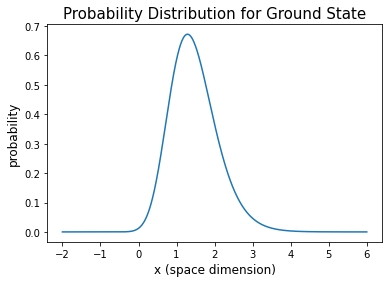

In [4]:
#exact solution

#n-th eigenfunction
def ψn (n, D, x):
    
    ν=np.sqrt(8*D)
    s=(ν-2*n-1)/(2)
    z=ν*np.exp(-(x-1))
    
    return np.sqrt((2*s*Γ(n+1))/(Γ(ν-n)))*L(n, 2*s, z)*(z**s)*np.exp(-z/2)

#plot probability distribution of ψ0

#parameters
D=2
n=0
xs=np.linspace(-2,6,10**3)

#plot
plt.plot(xs, np.abs(ψn(n, D, xs))**2)
plt.title("Probability Distribution for Ground State", fontsize="15")
plt.xlabel("x (space dimension)", fontsize="12")
plt.ylabel("probability", fontsize="12")
plt.show()

In [194]:
#compare groundstate eigenenergy (exact and numerical value)

#numerical result (go to Fourier space, discretise and sum over momenta)

#copied Fourier transform
def FT(psi_x,x_grid,k_grid):
  N=len(psi_x)
  delta_x=x_grid[1]-x_grid[0]
  delta_k=k_grid[1]-k_grid[0]
  psi_k=np.zeros(N,dtype=complex)
  for i in range(N):
    for j in range(N):
      psi_k[i]+=delta_x/math.sqrt(2*pi)*psi_x[j]*np.exp(-1j*k_grid[i]*x_grid[j])
  return psi_k

def IFT(psi_k,x_grid,k_grid):
  N=len(psi_k)
  delta_x=x_grid[1]-x_grid[0]
  delta_k=k_grid[1]-k_grid[0]
  psi_x=np.zeros(N,dtype=complex)
  for i in range(N):
    for j in range(N):
      psi_x[i]+=delta_k/math.sqrt(2*pi)*psi_k[j]*np.exp(1j*x_grid[i]*k_grid[j])
  return psi_x

#find grid parameters
x_max = 0

#check for non zero amplitudes to reduce grid size
for (amp, x) in zip(ψn(n,D,xs), xs):
    if np.round(np.abs(amp), decimals=10) != 0:
        if np.abs(x_max) < np.abs(x):
            x_max = x

print("X_max found: " + str(x_max))

#grid parameters
x_max=10
k_max=10
N=1001
x_grid=np.linspace(-x_max,x_max,N)
k_grid=np.linspace(-k_max,k_max,N)

#discretise
psi_x=[ψn(n,D,i) for i in x_grid]
psi_k=FT(psi_x, x_grid, k_grid)

#Morse potential
def morse_pot(D, x):
    
    return D*(np.exp(-2*(x-1))-2*np.exp(-(x-1)))

pot = [morse_pot(D, i) for i in x_grid]

#copied energy function
def ene(psi_x,psi_k,x_grid,k_grid,pot):
  N1=len(psi_k)
  N2=len(psi_x)
  delta_x=x_grid[1]-x_grid[0]
  delta_k=k_grid[1]-k_grid[0]
  x_grid=np.linspace(-x_max,x_max,N)
  k_grid=np.linspace(-k_max,k_max,N)
  E_ave=0
  for i in range(N1):
    E_ave+=0.5*delta_k*abs(psi_k[i])**2*k_grid[i]**2
  for i in range(N2):
    E_ave+=delta_x*abs(psi_x[i])**2*pot[i]
  return E_ave

E_num = ene(psi_x, psi_k, x_grid, k_grid, pot)

#exact result (use given equation)
ν=np.sqrt(8*D)
s=(ν-2*n-1)/(2)
E_exact = -s**2/2

#compare
print("\n ~ Energy results ~ \n")
print("Numerical result: \t" + str(E_num))
print("Exact result: \t\t" + str(E_exact))

X_max found: 10.0

 ~ Energy results ~ 

Numerical result: 	-1.1250000001879235
Exact result: 		-1.125


The two results match.

(Q6) Use the matrix squaring algorithm and calculate p(x) for $\beta=\{1/2,1,2,4,8\}$. Plot the results. Compare the results for $\beta=8$ with the ground state calculation from (Q1).



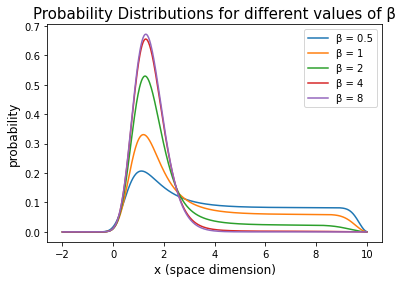

In [217]:
#matrix squaring

#copied matrices

#grid parameters
x_max=10
k_max=10
N=1001
x_grid=np.linspace(-x_max,x_max,N)
k_grid=np.linspace(-k_max,k_max,N)


# Free off-diagonal density matrix
def rho_free(x, xp, beta):
    return (math.exp(-(x - xp) ** 2 / (2.0 * beta)) /
            math.sqrt(2.0 * math.pi * beta))

# Trotter approximation (returns the full matrix)
def rho_morse_trotter(grid, beta):
    return np.array([[rho_free(x, xp, beta) * \
                         np.exp(-0.5 * beta * (morse_pot(D,x) + morse_pot(D,xp))) \
                         for x in grid] for xp in grid])

#parameters
βs = [1/2, 1, 2, 4, 8]                           
dx = x_grid[1]-x_grid[0]

#run matrix squaring 
def matrix_squaring(β,x_grid,dx):
    
    β_tmp = 2.0 ** (-8)                     # initial value of beta (power of 2)
    rho = rho_morse_trotter(x_grid, β_tmp)  # density matrix at initial beta
    while β_tmp < β:
        rho = np.dot(rho, rho)
        rho *= dx
        β_tmp *= 2.0

    return rho

rhos = [matrix_squaring(β,x_grid,dx) for β in βs]

#plot probability density obtained through Trotter approximation
for (rho, β) in zip(rhos, βs):
    plt.plot(x_grid[400:], (rho.diagonal()/(np.sum(rho.diagonal()*dx)))[400:], label=("β = " + str(β)))
    
plt.legend()
plt.title("Probability Distributions for different values of β", fontsize="15")
plt.xlabel("x (space dimension)", fontsize="12")
plt.ylabel("probability", fontsize="12")
plt.show()

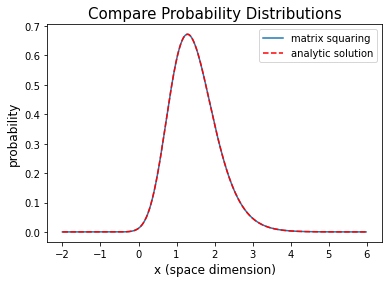

In [358]:
#compare β = 8 and analytic solution for the ground state
#grid parameters
x_max=10
k_max=10
N=1001
x_grid=np.linspace(-x_max,x_max,N)
k_grid=np.linspace(-k_max,k_max,N)

plt.plot(x_grid[400:800], (rhos[-1].diagonal()/(np.sum(rhos[-1].diagonal()*dx)))[400:800], label="matrix squaring")
plt.plot(xs, np.abs(ψn(n, D, xs))**2, label="analytic solution", linestyle="dashed", color="red")
plt.legend()
plt.title("Compare Probability Distributions", fontsize="15")
plt.xlabel("x (space dimension)", fontsize="12")
plt.ylabel("probability", fontsize="12")
plt.show()

For low temperatures e.g. $\beta = 8$ we recover the groundstate, just as expected.

(Q7) Calculate $p(x)$ using the local update Monte Carlo for $\beta=8$. Compare the results with (Q2).

In [343]:
#use info from SMAC by Krauth (chapter 3.3.1)

D=2

beta = 8.0
N = 32                                       # number of slices
dtau = beta / N
delta = 1                                    # maximum displacement on one slice
n_steps = 10**7                                 # number of Monte Carlo steps

acc = 0

x_s = []

x = [0.0] * N

for step in range(n_steps):
    k = random.randint(0, N - 1)                  # random slice
    knext, kprev = (k + 1) % N, (k - 1) % N       # next/previous slices
    x_new = x[k] + random.uniform(-delta, delta)  # new position at slice k
    old_weight  = (rho_free(x[knext], x[k], dtau) *
                   rho_free(x[k], x[kprev], dtau) *
                   math.exp(-dtau*morse_pot(D, x[k])))
    new_weight  = (rho_free(x[knext], x_new, dtau) *
                   rho_free(x_new, x[kprev], dtau) *
                   math.exp(-dtau*morse_pot(D, x_new)))
    if random.uniform(0.0, 1.0) < (new_weight / old_weight):
        x[k] = x_new
        acc += 1

    x_s.append(x[0])
    
        
print("acceptance rate: " + str(acc/n_steps))

accetance rate: 0.5003911


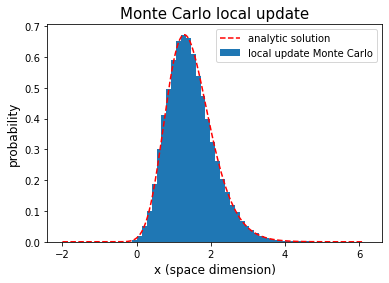

In [361]:
plt.hist(np.array(x_s).flatten(), density=True, bins=50, label="local update Monte Carlo")
plt.plot(np.linspace(-2,6.1,10**3), (np.abs(ψn(n, D, np.linspace(-2,6.1,10**3)))**2), label="analytic solution", linestyle="dashed", color="red")
plt.legend()
plt.title("Monte Carlo local update", fontsize="15")
plt.xlabel("x (space dimension)", fontsize="12")
plt.ylabel("probability", fontsize="12")
plt.show()
#print(len(np.array(x_s).flatten()))

The results match perfectly!

(Q8) Prepare the particle in the ground state $\ket{\psi_0}$ of the Morse potential with $D_e=1$.
After the initial state is prepared, change the depth of potential to $D_e=0.5$ and simulate the real time dynamics up to time $t=10$. Make the animation.

In [11]:
#time evolution

#grid parameters
x_max=10
k_max=10
N=501
x_grid=np.linspace(-x_max,x_max,N)
k_grid=np.linspace(-k_max,k_max,N)


def time_prop(psi,pot,delta_t,x_grid,k_grid):
  N1=len(x_grid)
  N2=len(k_grid)
  for i in range(0,N1):
    psi[i]=np.exp(-1j*delta_t*pot[i]/2)*psi[i]
  psi_k=FT(psi,x_grid,k_grid)
  for i in range(0,N2):
    psi_k[i]=np.exp(-1j*delta_t*k_grid[i]**2/2)*psi_k[i]
  psi=IFT(psi_k,x_grid,k_grid)
  for i in range(0,N1):
    psi[i]=np.exp(-1j*delta_t*pot[i]/2)*psi[i]
  return psi


#initial psi is in ground state for D=1
ψt = [ψn(n=0, D=1, x=x) for x in x_grid]
#Morse potential for D=0.5
pot = [morse_pot(D=0.5, x=x) for x in x_grid]

#time evolution up to t=10 in 200 steps
t_max=10
T=200
delta_t=t_max/T
ψts = []

for i in range(T):
    ψt = time_prop(ψt, pot, delta_t, x_grid, k_grid)
    ψts.append(ψt)


In [12]:
from matplotlib import animation
from matplotlib import rc
from IPython.display import HTML

rc('animation', html='jshtml')

prob = [np.abs(ψ)**2 for ψ in ψts]
pot = [morse_pot(D=0.5, x=x) for x in x_grid]

fig = plt.figure()
ax = plt.axes(xlim=(-2, 11), ylim=(-1.1, 1.1))

plt.xlabel('x (space dimension)')
plt.ylabel('probability/potential strength')

line1, = ax.plot([], [], lw=2)
line2, = ax.plot([], [], lw=2)

def init():
    line1.set_data([],[])
    line2.set_data([],[])
    return line1, line2

def animate(i):
    line1.set_data(x_grid, np.array(prob[i]))
    if i ==0:
        line2.set_data(x_grid, [morse_pot(D=1, x=x) for x in x_grid])
    else:
        line2.set_data(x_grid, pot)
        
    return line1, line2,

anim = animation.FuncAnimation(fig, animate,frames= len(prob), interval=50)
plt.close(anim._fig)


f = r"morse_animation.mp4" 
writervideo = animation.FFMpegWriter(fps=30) 
anim.save(f, writer=writervideo)

HTML(anim.to_jshtml())

(Q9) Consider the problem where the depth of the potential is periodically driven $D_e(t)=(1+ \sin(\omega t))$, with the system initialized in the ground state. Plot $\langle x(t)\rangle$ for $\omega= 0.1$, $\omega=1$ and $\omega=10$. Comment on the results.

In [6]:
#periodical driving
def D_t(ω, t):
    return 1 + np.sin(ω*t)


ωs = [0.1, 1, 10]

#time evolution up to t=10 in 200 steps
t_max=10
T=200
delta_t=t_max/T

#grid parameters
x_max=20
k_max=20
N=1001
x_grid=np.linspace(-x_max,x_max,N)
k_grid=np.linspace(-k_max,k_max,N)
#spacing
dx = x_grid[1] - x_grid[0]

#save results
means = []
ψts_driven = []

for ω in ωs:
    
    #initial psi is in ground state for D=1
    ψt = [ψn(n=0, D=1, x=x) for x in x_grid]
    
    x_means = np.zeros(T)
    ψtemp=[]
    
    for i in range(T):

        #Morse potential for D(t) where t= i*delta_t
        pot = [morse_pot(D_t(ω, t=i*delta_t), x) for x in x_grid]
        ψt = time_prop(ψt, pot, delta_t, x_grid, k_grid)

        x_mean = 0
        for j, x in enumerate(x_grid):
            x_mean += x* dx* np.abs(ψt[j])**2

        x_means[i] = x_mean

        ψtemp.append(ψt)
        
    means.append(x_means)
    ψts_driven.append(ψtemp)

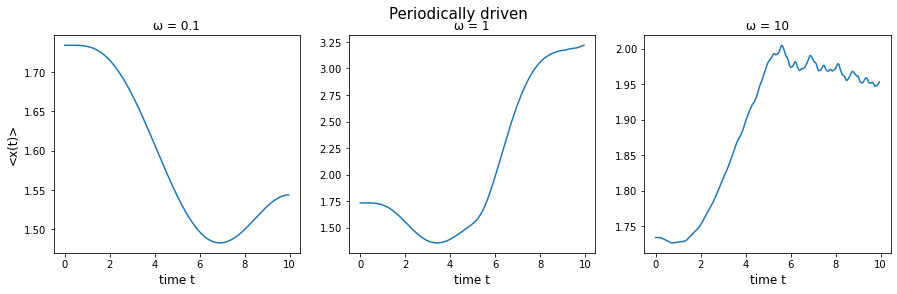

In [32]:
ts = [i*delta_t for i in range(T)]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
fig.set_figwidth(15)

fig.suptitle('Periodically driven', fontsize="15")
ax1.plot(ts, means[0])
ax2.plot(ts, means[1])
ax3.plot(ts, means[2])

ax1.set_title("ω = " + str(ωs[0]))
ax2.set_title("ω = " + str(ωs[1]))
ax3.set_title("ω = " + str(ωs[2]))

ax1.set_xlabel("time t", fontsize="12")
ax2.set_xlabel("time t", fontsize="12")
ax3.set_xlabel("time t", fontsize="12")

ax1.set_ylabel("<x(t)>", fontsize="12")

plt.show()

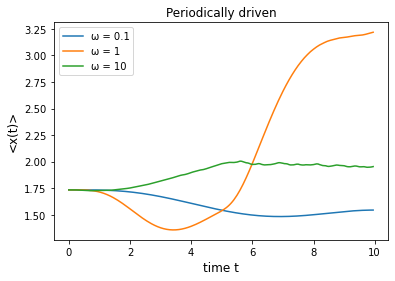

In [9]:
plt.title("Periodically driven")
plt.plot(ts, means[0], label=("ω = " + str(ωs[0])))
plt.plot(ts, means[1], label=("ω = " + str(ωs[1])))
plt.plot(ts, means[2], label=("ω = " + str(ωs[2])))
plt.legend()
plt.ylabel("<x(t)>", fontsize="12")
plt.xlabel("time t", fontsize="12")
plt.show()

Here I have increased the grid size to avoid boundary effects/reflections.

The average position varies strongly in time for $\omega = 1$ as compared to the other angular frequencies. At $t=\pi$, after half a period of the driving, $<x(t)>$ reaches its minimum. This is expected, because in this period of time the potential becomes deeper and narrower towards $x=0$ (see animation below). After $t=\pi$ the potential starts changing in the opposite direction (depth decreases and becomes less narrow) and $<x(t)>$ reacts accordingly by increasing.

For $\omega = 0.1$ we see a similar effect as for $\omega = 1$ and $t \in [0,\pi]$. Namely, $<x(t)>$ decreases as the potential deepens and becomes more narrow. Since half a period amounts to $\delta t = 10\pi$ for $\omega = 0.1$, this is the only effect we can observe.

For $\omega = 10$ the potential oscillates so quickly, that $<x(t)>$ becomes effectively constant after a short period of time. However, we should be sceptical as $\omega = 10$ gives us a period of $T=\pi /10 \approx 0.31$ and we discretise time in steps of $dt = 10/200= 0.05$. Only one order of magnitude seperates these two quantities. See the last plot for more information on this.

In [31]:
rc('animation', html='jshtml')

probs = [[np.abs(ψ)**2 for ψ in ψts] for ψts in ψts_driven]

#grid parameters
x_max=20
k_max=20
N=1001
x_grid=np.linspace(-x_max,x_max,N)
k_grid=np.linspace(-k_max,k_max,N)
#spacing
dx = x_grid[1] - x_grid[0]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
fig.set_figwidth(15)


ax1.set_ylim(-2.1, 1.1)
ax2.set_ylim(-2.1, 1.1)
ax3.set_ylim(-2.1, 1.1)
ax1.set_xlim(-2, 21)
ax1.set_xlim(-2, 21)
ax2.set_xlim(-2, 21)
ax3.set_xlim(-2, 21)

ax1.set_xlabel('x (space dimension)')
ax2.set_xlabel('x (space dimension)')
ax3.set_xlabel('x (space dimension)')
ax1.set_ylabel('probability/potential strength')
#ax2.set_ylabel('probability/potential strength')
#ax3.set_ylabel('probability/potential strength')

line1_1, = ax1.plot([], [], lw=2)
line2_1, = ax1.plot([], [], lw=2)
line1_2, = ax2.plot([], [], lw=2)
line2_2, = ax2.plot([], [], lw=2)
line1_3, = ax3.plot([], [], lw=2)
line2_3, = ax3.plot([], [], lw=2)

def init():
    line1_1.set_data([],[])
    line2_1.set_data([],[])
    line1_2.set_data([],[])
    line2_2.set_data([],[])
    line1_3.set_data([],[])
    line2_3.set_data([],[])
    return line1_1, line2_1, line1_2, line2_2, line1_3, line2_3

def animate(i):
    line1_1.set_data(x_grid, np.array(probs[0][i]))
    line1_2.set_data(x_grid, np.array(probs[1][i]))
    line1_3.set_data(x_grid, np.array(probs[2][i]))
    
    line2_1.set_data(x_grid, [morse_pot(D=D_t(ωs[0], t=i*delta_t), x=x) for x in x_grid])
    line2_2.set_data(x_grid, [morse_pot(D=D_t(ωs[1], t=i*delta_t), x=x) for x in x_grid])
    line2_3.set_data(x_grid, [morse_pot(D=D_t(ωs[2], t=i*delta_t), x=x) for x in x_grid])
        
    return line1_1, line2_1, line1_2, line2_2, line1_3, line2_3


anim = animation.FuncAnimation(fig, animate,frames= len(probs[0]), interval=50)
plt.close(anim._fig)

f = r"morse_driven_animation.mp4" 
writervideo = animation.FFMpegWriter(fps=30) 
anim.save(f, writer=writervideo)

HTML(anim.to_jshtml())

In [34]:
#rerun with higher time resolution

ωs = [0.1, 1, 10]

#time evolution up to t=10 in 2000 steps
t_max=10
T=500
delta_t=t_max/T

#grid parameters
x_max=20
k_max=20
N=1001
x_grid=np.linspace(-x_max,x_max,N)
k_grid=np.linspace(-k_max,k_max,N)
#spacing
dx = x_grid[1] - x_grid[0]

#save results
means_high = []
ψts_high = []

    
#initial psi is in ground state for D=1
ψt = [ψn(n=0, D=1, x=x) for x in x_grid]

x_means = np.zeros(T)
ψtemp=[]

for i in range(T):

    #Morse potential for D(t) where t= i*delta_t
    pot = [morse_pot(D_t(ωs[2], t=i*delta_t), x) for x in x_grid]
    ψt = time_prop(ψt, pot, delta_t, x_grid, k_grid)

    x_mean = 0
    for j, x in enumerate(x_grid):
        x_mean += x* dx* np.abs(ψt[j])**2

    x_means[i] = x_mean

    ψtemp.append(ψt)

means_high.append(x_means)
ψts_high.append(ψtemp)

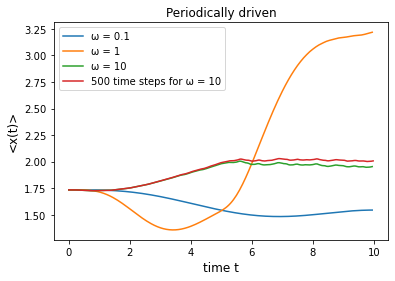

In [39]:


plt.title("Periodically driven")
plt.plot(ts, means[0], label=("ω = " + str(ωs[0])))
plt.plot(ts, means[1], label=("ω = " + str(ωs[1])))
plt.plot(ts, means[2], label=("ω = " + str(ωs[2])))
plt.plot([i*delta_t for i in range(T)], means_high[0], label=("500 time steps for ω = " + str(ωs[2])))
plt.legend()
plt.ylabel("<x(t)>", fontsize="12")
plt.xlabel("time t", fontsize="12")
plt.show()

Increasing the resolution in time from $dt = 0.05$ to $dt = 0.02$ did not change the result significantly, an even higher resolution would exceed my computational power. 